## Supervised Learning Zone

This section implements the supervised learning stage of the aesthetic cropping system. A lightweight vision model is trained to predict an initial crop for people-centered photographs, which serves as the starting point for subsequent reinforcement learning refinement.

Training uses person-only images with human-annotated bounding boxes treated as proxy aesthetic crop targets. The model predicts normalized crop parameters \((x_{center}, y_{center}, width, height)\) using aspect-ratio–preserving preprocessing for resolution-independent inference. The architecture employs a TinyViT-style backbone with a regression head, trained end-to-end using supervised regression losses. The best-performing checkpoint is selected on a validation set and frozen for use during the reinforcement learning stage.



In [1]:
# Imports for the full pipeline for data handling, visualization, PyTorch training,

import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as T
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random 
import time
import cv2

from pathlib import Path
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split


In [2]:
SEED = 42            # Fixed seed value to ensure reproducibility of results
NUM_EPOCH = 15       # Number of training epochs
IMAGE_SIZE = 224     # Input image dimension required by EfficientNet-B0
BATCH_SIZE = 16      # Number of samples processed per training batch

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [3]:

PROJECT_ROOT = Path().resolve().parent
DATA_DIR = PROJECT_ROOT / "data"
PROCESSED_DIR = DATA_DIR / "processed"
MODELS_DIR = PROJECT_ROOT / "models"

CSV_PATH = PROCESSED_DIR / "person_clean_dataset.csv"

df = pd.read_csv(CSV_PATH)
print("DATASET ROWS:", len(df))
df.head()

DATASET ROWS: 1768


,image_id,image_path,XMin,XMax,YMin,YMax
0,00d449b98c6c9d53,../data/raw_images/train/person/00d449b98c6c9d...,0.166667,0.846667,0.208750,0.808750
1,00dcfd103c9f5ca2,../data/raw_images/train/person/00dcfd103c9f5c...,0.015000,0.196250,0.150943,0.798113
2,00e71dd7bd07a35d,../data/raw_images/train/person/00e71dd7bd07a3...,0.000000,0.658594,0.000000,0.998824
3,003e8ba2ccad2bc6,../data/raw_images/train/person/003e8ba2ccad2b...,0.360938,0.946875,0.069792,0.854167
4,03c921fb5a7fd2b0,../data/raw_images/train/person/03c921fb5a7fd2...,0.299219,0.418750,0.512695,0.889648


In [4]:
# compute center (xc, yc) and width/height (w, h) in normalized [0,1]
df["xc"] = (df["XMin"] + df["XMax"]) / 2.0
df["yc"] = (df["YMin"] + df["YMax"]) / 2.0
df["w"]  = df["XMax"] - df["XMin"]
df["h"]  = df["YMax"] - df["YMin"]

df[["image_path", "xc", "yc", "w", "h"]].head()


,image_path,xc,yc,w,h
0,../data/raw_images/train/person/00d449b98c6c9d...,0.506667,0.508750,0.680000,0.600000
1,../data/raw_images/train/person/00dcfd103c9f5c...,0.105625,0.474528,0.181250,0.647170
2,../data/raw_images/train/person/00e71dd7bd07a3...,0.329297,0.499412,0.658594,0.998824
3,../data/raw_images/train/person/003e8ba2ccad2b...,0.653906,0.461979,0.585937,0.784375
4,../data/raw_images/train/person/03c921fb5a7fd2...,0.358985,0.701172,0.119531,0.376953


In [5]:
train_df, val_df = train_test_split(
    df, test_size=0.2, random_state=42, shuffle=True,
)

len(train_df), len(val_df)

(1414, 354)

In [6]:
class CropDataset(Dataset):
    def __init__(self, df, transform=None, image_size=224, max_retries=10):
        self.df = df.reset_index(drop=True)
        self.transform = transform
        self.image_size = image_size
        self.max_retries = max_retries

        if self.transform is None:
            self.transform = T.Compose([
                T.Resize((image_size, image_size)),
                T.ToTensor(),
                T.Normalize(mean=[0.485, 0.456, 0.406],
                            std=[0.229, 0.224, 0.225]),
            ])

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
            # Retry sampling if file is missing/corrupt
            for _ in range(self.max_retries):
                row = self.df.iloc[idx]
                img_path = row["image_path"]

                # If file missing, resample another index
                if not os.path.exists(img_path):
                    idx = random.randint(0, len(self.df) - 1)
                    continue

                try:
                    # 1. Load Image as PIL
                    img = Image.open(img_path).convert("RGB")
                except Exception:
                    idx = random.randint(0, len(self.df) - 1)
                    continue

                # Get original normalized coordinates
                box_norm = [
                    row['xc'], 
                    row['yc'], 
                    row['w'], 
                    row['h']
                ]

                # Apply Letterbox (Resizes Image + Adjusts Box + Converts to Tensor)
                img_tensor, target_tensor = self.letterbox_transform(img, box_norm, target_size=self.image_size)

                # Standard ImageNet normalization
                normalizer = T.Normalize(mean=[0.485, 0.456, 0.406], 
                                        std=[0.229, 0.224, 0.225])
                img_tensor = normalizer(img_tensor)

                return img_tensor, target_tensor

            # If too many failures
            raise RuntimeError(
                f"CropDataset: exceeded max_retries={self.max_retries}."
            )
    

    
    def letterbox_transform(self, image, box_norm, target_size=224):

        w_orig, h_orig = image.size
        
        # Calculate Scale to fit the largest side
        scale = target_size / max(w_orig, h_orig)
        w_new = int(w_orig * scale)
        h_new = int(h_orig * scale)
        
        # Resize the image (keeping aspect ratio)
        img_resized = image.resize((w_new, h_new), Image.BILINEAR)
        
        # Create the "Canvas" (black background)
        canvas = Image.new("RGB", (target_size, target_size), (0, 0, 0))
        
        # Calculate Padding (center the image)
        pad_w = (target_size - w_new) // 2
        pad_h = (target_size - h_new) // 2
        canvas.paste(img_resized, (pad_w, pad_h))
        
        xc, yc, w, h = box_norm
        
        # Un-normalize: Get the original pixel coordinates relative to the OLD image
        xc_pix = xc * w_orig
        yc_pix = yc * h_orig
        w_pix  = w  * w_orig
        h_pix  = h  * h_orig
        
        # Scale: Apply the resize scale
        xc_pix *= scale
        yc_pix *= scale
        w_pix  *= scale
        h_pix  *= scale
        
        # Shift: Add the padding offsets
        xc_pix += pad_w
        yc_pix += pad_h
        
        # Re-normalize: Divide by the NEW canvas size (target_size)
        xc_new = xc_pix / target_size
        yc_new = yc_pix / target_size
        w_new  = w_pix  / target_size
        h_new  = h_pix  / target_size
        
        # Convert image to tensor
        img_tensor = T.ToTensor()(canvas)
        box_tensor = torch.tensor([xc_new, yc_new, w_new, h_new], dtype=torch.float32)
        
        return img_tensor, box_tensor

In [7]:
train_dataset = CropDataset(train_df, image_size=IMAGE_SIZE)
val_dataset   = CropDataset(val_df, image_size=IMAGE_SIZE)

g = torch.Generator()
g.manual_seed(SEED)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, generator=g)

val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

In [8]:
class CropRegressor(nn.Module):
    def __init__(self, embed_dim=224, hidden_dim=128, min_wh=0.05):
        super().__init__()
        self.min_wh = float(min_wh)

        self.mlp = nn.Sequential(
            nn.Linear(embed_dim, hidden_dim),
            nn.ReLU(inplace=True),
            nn.Linear(hidden_dim, 4),
            nn.Sigmoid(),
        )

    def forward(self, feats):
        out = self.mlp(feats)  # (B,4) in (0,1)

        xc = out[:, 0]
        yc = out[:, 1]
        w  = out[:, 2].clamp(min=self.min_wh)
        h  = out[:, 3].clamp(min=self.min_wh)

        half_w = 0.5 * w
        half_h = 0.5 * h

        xc = xc.clamp(min=half_w, max=1.0 - half_w)
        yc = yc.clamp(min=half_h, max=1.0 - half_h)

        # rebuild tensor (NOT in-place)
        return torch.stack([xc, yc, w, h], dim=1)



We used pretrained EfficientNet-B0. It is designed to be incredibly efficient but usually achieves much higher accuracy than MobileNet or ResNet by carefully balancing depth, width, and resolution.

In [9]:
class PretrainedCropModel(nn.Module):
    def __init__(self):
        super().__init__()
        # Load Pretrained Backbone
        backbone = models.efficientnet_b0(weights='DEFAULT')
        self.backbone = backbone.features
        
        # Remove the classification head (classifier) to get features
        self.backbone = backbone.features
        self.pool = nn.AdaptiveAvgPool2d((1, 1))
        
        # 3. Attach your custom regression head
        self.head = CropRegressor(embed_dim=1280)

    def forward(self, x):
        x = self.backbone(x)      # Extract features
        x = self.pool(x)          # Global Average Pool
        x = x.flatten(1)          # Flatten to (B, embed_dim)
        pred_boxes = self.head(x) # Regress box
        return pred_boxes

In [10]:
def box_xywh_to_xyxy(box, eps=1e-6):
    xc, yc, w, h = box[:, 0], box[:, 1], box[:, 2], box[:, 3]
    w = w.clamp(min=eps)
    h = h.clamp(min=eps)

    x1 = (xc - 0.5 * w)
    y1 = (yc - 0.5 * h)
    x2 = (xc + 0.5 * w)
    y2 = (yc + 0.5 * h)

    xyxy = torch.stack([x1, y1, x2, y2], dim=1)
    return xyxy.clamp(0.0, 1.0)

def iou_loss(pred, target, eps=1e-6, giou=False, reduction="mean"):
    pred_xyxy = box_xywh_to_xyxy(pred, eps=eps)
    tgt_xyxy  = box_xywh_to_xyxy(target, eps=eps)

    # Intersection
    x1 = torch.max(pred_xyxy[:, 0], tgt_xyxy[:, 0])
    y1 = torch.max(pred_xyxy[:, 1], tgt_xyxy[:, 1])
    x2 = torch.min(pred_xyxy[:, 2], tgt_xyxy[:, 2])
    y2 = torch.min(pred_xyxy[:, 3], tgt_xyxy[:, 3])

    inter_w = (x2 - x1).clamp(min=0)
    inter_h = (y2 - y1).clamp(min=0)
    inter = inter_w * inter_h

    # Areas
    area_pred = (pred_xyxy[:, 2] - pred_xyxy[:, 0]).clamp(min=0) * \
                (pred_xyxy[:, 3] - pred_xyxy[:, 1]).clamp(min=0)
    area_tgt  = (tgt_xyxy[:, 2] - tgt_xyxy[:, 0]).clamp(min=0) * \
                (tgt_xyxy[:, 3] - tgt_xyxy[:, 1]).clamp(min=0)

    union = area_pred + area_tgt - inter + eps
    iou = inter / union

    if giou:
        # Enclosing box
        cx1 = torch.min(pred_xyxy[:, 0], tgt_xyxy[:, 0])
        cy1 = torch.min(pred_xyxy[:, 1], tgt_xyxy[:, 1])
        cx2 = torch.max(pred_xyxy[:, 2], tgt_xyxy[:, 2])
        cy2 = torch.max(pred_xyxy[:, 3], tgt_xyxy[:, 3])

        c_area = (cx2 - cx1).clamp(min=0) * (cy2 - cy1).clamp(min=0) + eps
        giou_val = iou - (c_area - union) / c_area
        loss_vec = 1.0 - giou_val
    else:
        loss_vec = 1.0 - iou

    if reduction == "mean":
        return loss_vec.mean()
    if reduction == "sum":
        return loss_vec.sum()
    return loss_vec

In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = PretrainedCropModel().to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)

# Drop Learning Rate by 10x every 5 epochs to force fine-tuning
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)


### Training Helper Metrics Functions

In [12]:
# Diagnostic Metrics for Validation
def compute_metrics(pred, target, eps=1e-6):
    
    # Convert to x1, y1, x2, y2
    pred_xyxy = box_xywh_to_xyxy(pred, eps=eps)
    tgt_xyxy  = box_xywh_to_xyxy(target, eps=eps)

    # Intersection
    x1 = torch.max(pred_xyxy[:, 0], tgt_xyxy[:, 0])
    y1 = torch.max(pred_xyxy[:, 1], tgt_xyxy[:, 1])
    x2 = torch.min(pred_xyxy[:, 2], tgt_xyxy[:, 2])
    y2 = torch.min(pred_xyxy[:, 3], tgt_xyxy[:, 3])

    inter_w = (x2 - x1).clamp(min=0)
    inter_h = (y2 - y1).clamp(min=0)
    inter = inter_w * inter_h

    # Areas
    area_pred = (pred_xyxy[:, 2] - pred_xyxy[:, 0]).clamp(min=0) * \
                (pred_xyxy[:, 3] - pred_xyxy[:, 1]).clamp(min=0)
    area_tgt  = (tgt_xyxy[:, 2] - tgt_xyxy[:, 0]).clamp(min=0) * \
                (tgt_xyxy[:, 3] - tgt_xyxy[:, 1]).clamp(min=0)

    # Compute Metrics
    union = area_pred + area_tgt - inter + eps
    
    iou = inter / union
    containment = inter / (area_tgt + eps) # How much of the Target did we capture?

    return iou.mean(), containment.mean()

smooth_l1 = nn.SmoothL1Loss()

def train_one_epoch(model, loader, optimizer, device, epoch=None):
    model.train()
    total_loss = 0.0
    start_time = time.time()

    for batch_idx, (imgs, targets) in enumerate(loader, start=1):
        imgs = imgs.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()
        preds = model(imgs)

        # Loss Calculation
        l1 = smooth_l1(preds, targets)
        iou = iou_loss(preds, targets, giou=True)
        loss = l1 + iou

        loss.backward()
        optimizer.step()

        total_loss += loss.item() * imgs.size(0)

    epoch_loss = total_loss / len(loader.dataset)
    epoch_time = time.time() - start_time
    
    # Print progress
    print(f"→ Epoch {epoch} [Train] Loss: {epoch_loss:.4f} | Time: {epoch_time:.2f}s")
    return epoch_loss, epoch_time


@torch.no_grad()
def eval_one_epoch(model, loader, device, epoch=None):
    model.eval()
    total_loss = 0.0
    total_iou = 0.0
    total_cont = 0.0
    
    # We count batches to average metrics later
    num_batches = len(loader) 

    for batch_idx, (imgs, targets) in enumerate(loader, start=1):
        imgs = imgs.to(device)
        targets = targets.to(device)

        preds = model(imgs)
        
        # Loss
        l1 = smooth_l1(preds, targets)
        iou_l = iou_loss(preds, targets, giou=True)
        loss = l1 + iou_l

        total_loss += loss.item() * imgs.size(0)
        
        # Metrics
        batch_iou, batch_cont = compute_metrics(preds, targets)
        total_iou += batch_iou.item()
        total_cont += batch_cont.item()

    # Averages
    epoch_loss = total_loss / len(loader.dataset)
    avg_iou = total_iou / num_batches
    avg_cont = total_cont / num_batches

    print(f"→ Epoch {epoch} [Val]   Loss: {epoch_loss:.4f} | IoU: {avg_iou:.4f} | Containment: {avg_cont:.4f}")
    
    # Return all three so we can log them
    return epoch_loss, avg_iou, avg_cont

### Main Run-Loop

In [13]:
training_log = []

CHECKPOINT_DIR ="../models/best_aesthetic_cropper.pth"

best_val_iou = 0.0

for epoch in range(1, NUM_EPOCH + 1):
    # Train
    train_loss, epoch_time = train_one_epoch(
        model, train_loader, optimizer, device, epoch=epoch
    )

    # Validate (Now returns 3 values)
    val_loss, val_iou, val_cont = eval_one_epoch(
        model, val_loader, device, epoch=epoch
    )

    scheduler.step()
    
    # Log training progress
    training_log.append({
        "epoch": epoch,
        "train_loss": train_loss,
        "val_loss": val_loss,
        "val_iou": val_iou,
        "val_containment": val_cont,
        "epoch_time_sec": epoch_time,
        "learning_rate": optimizer.param_groups[0]["lr"],
    })

    # Check if this is the best model so far
    if val_iou > best_val_iou:
        print(f"Best Model IoU Score: {best_val_iou:.4f} → {val_iou:.4f}")
        best_val_iou = val_iou
        torch.save(model.state_dict(), CHECKPOINT_DIR) # Save the model weights
    print("-" * 70)

# Create DataFrame
training_df = pd.DataFrame(training_log)
training_df

→ Epoch 1 [Train] Loss: 0.7167 | Time: 206.27s
→ Epoch 1 [Val]   Loss: 0.7098 | IoU: 0.3605 | Containment: 0.7292
Best Model IoU Score: 0.0000 → 0.3605
----------------------------------------------------------------------
→ Epoch 2 [Train] Loss: 0.6547 | Time: 188.81s
→ Epoch 2 [Val]   Loss: 0.6879 | IoU: 0.3762 | Containment: 0.7701
Best Model IoU Score: 0.3605 → 0.3762
----------------------------------------------------------------------
→ Epoch 3 [Train] Loss: 0.6218 | Time: 182.80s
→ Epoch 3 [Val]   Loss: 0.6806 | IoU: 0.3847 | Containment: 0.7459
Best Model IoU Score: 0.3762 → 0.3847
----------------------------------------------------------------------
→ Epoch 4 [Train] Loss: 0.5917 | Time: 182.87s
→ Epoch 4 [Val]   Loss: 0.6761 | IoU: 0.3861 | Containment: 0.7387
Best Model IoU Score: 0.3847 → 0.3861
----------------------------------------------------------------------
→ Epoch 5 [Train] Loss: 0.5638 | Time: 182.43s
→ Epoch 5 [Val]   Loss: 0.6659 | IoU: 0.3972 | Containment: 0

,epoch,train_loss,val_loss,val_iou,val_containment,epoch_time_sec,learning_rate
0,1,0.716666,0.709821,0.360476,0.729186,206.269144,1.000000e-04
1,2,0.654720,0.687932,0.376230,0.770068,188.814650,1.000000e-04
2,3,0.621777,0.680577,0.384712,0.745863,182.800267,1.000000e-04
3,4,0.591709,0.676124,0.386097,0.738696,182.868689,1.000000e-04
4,5,0.563819,0.665898,0.397182,0.731803,182.434359,1.000000e-05
5,6,0.537576,0.660650,0.401310,0.745060,181.196860,1.000000e-05
6,7,0.525516,0.660537,0.403042,0.715662,182.554377,1.000000e-05
7,8,0.520364,0.655696,0.405680,0.742184,181.163246,1.000000e-05
8,9,0.523362,0.660248,0.404210,0.703635,181.799435,1.000000e-05
9,10,0.513963,0.652546,0.408938,0.742888,185.087956,1.000000e-06


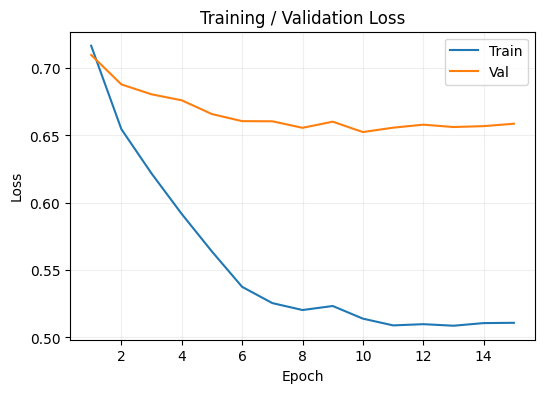

In [14]:
plt.figure(figsize=(6,4))

plt.plot(training_df["epoch"], training_df["train_loss"], label="Train")
plt.plot(training_df["epoch"], training_df["val_loss"], label="Val")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training / Validation Loss")
plt.grid(alpha=0.2)
plt.legend()
plt.show()


The supervised TinyViT crop regression model converged after fine-tuning at a learning rate of 1e-5, with stable and smoothly decreasing training and validation losses. Further training yielded diminishing returns, indicating convergence.

[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


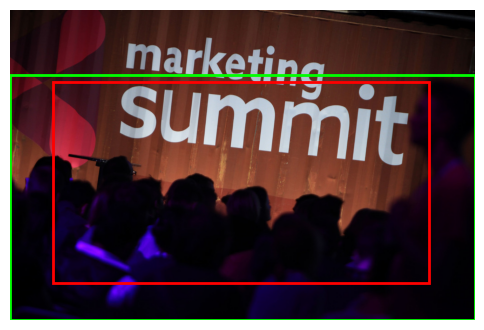

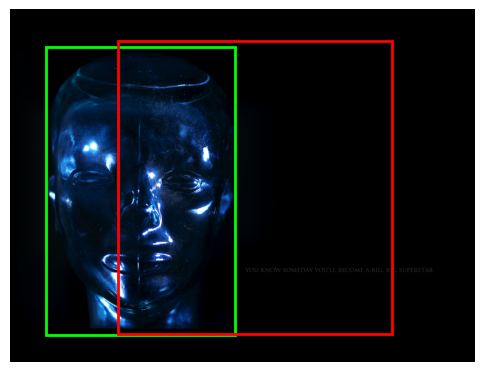

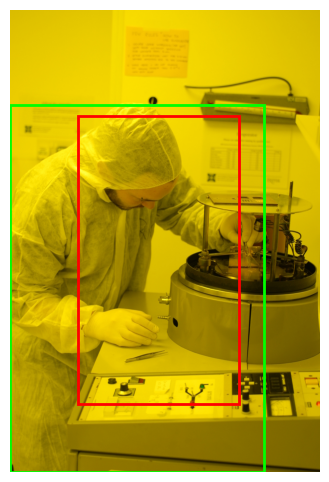

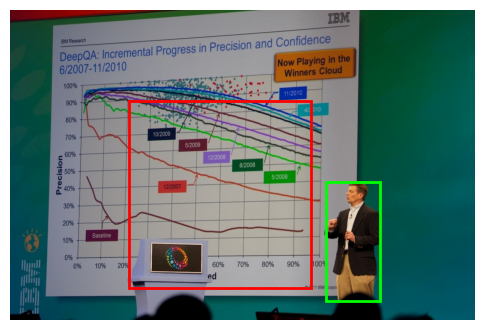

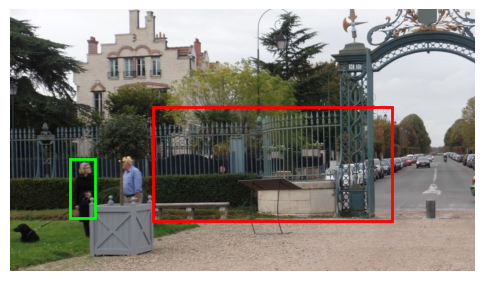

In [15]:
@torch.no_grad()
def visualize_predictions(model, df_sample, num_samples=5):
    model.eval()
    for i in range(num_samples):
        row = df_sample.sample(1).iloc[0]
        img_path = row["image_path"]
        img = Image.open(img_path).convert("RGB")
        w, h = img.size

        # prepare input
        x = train_dataset.transform(img).unsqueeze(0).to(device)  # reuse transform
        pred = model(x).cpu().squeeze(0).numpy()

        # gt & pred boxes (xc,yc,w,h)
        gt = np.array([row["xc"], row["yc"], row["w"], row["h"]])

        def xywh_to_xyxy(box):
            xc, yc, bw, bh = box
            x1 = (xc - bw/2) * w
            y1 = (yc - bh/2) * h
            x2 = (xc + bw/2) * w
            y2 = (yc + bh/2) * h
            return x1, y1, x2, y2

        gt_x1, gt_y1, gt_x2, gt_y2 = xywh_to_xyxy(gt)
        pr_x1, pr_y1, pr_x2, pr_y2 = xywh_to_xyxy(pred)

        fig, ax = plt.subplots(1, figsize=(6,6))
        ax.imshow(img)

        # GT in green
        ax.add_patch(
            patches.Rectangle(
                (gt_x1, gt_y1),
                gt_x2 - gt_x1, gt_y2 - gt_y1,
                linewidth=2, edgecolor="lime", facecolor="none", label="GT"
            )
        )
        # Pred in red
        ax.add_patch(
            patches.Rectangle(
                (pr_x1, pr_y1),
                pr_x2 - pr_x1, pr_y2 - pr_y1,
                linewidth=2, edgecolor="red", facecolor="none", label="Pred"
            )
        )

        plt.axis("off")
        plt.show()

visualize_predictions(model, val_df, num_samples=5)


After convergence, the supervised TinyViT crop regression model was frozen and used as a fixed baseline for further evaluation and reinforcement learning refinement.

In [16]:
# Load trained supervised cropper
ckpt = torch.load("../models/tinyvit_supervised_final_ckpt.pth", map_location=device)
model.load_state_dict(ckpt["model_state_dict"])

# Freeze supervised cropper for RL
model.eval()
for p in model.parameters():
    p.requires_grad = False

supervised_model = model  # alias for clarity

# Sanity check
assert not any(p.requires_grad for p in supervised_model.parameters())


## Reinforcement Learning Zone

This section implements the reinforcement learning (RL) refinement stage of the aesthetic cropping system. Rather than replacing the supervised cropper, the RL agent **incrementally refines** its initial crop predictions through photographer-like actions such as panning, zooming, and stopping.

The agent operates on top of a **frozen, pretrained supervised crop regression model**, which provides the initial crop for each episode. Each episode is constructed from a randomly sampled training image, treating the dataset as a distribution of environments to promote generalization.

The environment state includes the current cropped image patch and its normalized crop parameters `((x_{center}, y_{center}, width, height)`. The agent selects actions from a discrete action space, and crop updates are constrained to valid image bounds.

A shaped reward function guides learning by combining IoU improvement, subject containment and edge-cut penalties, and lightweight aesthetic heuristics such as headroom and rule-of-thirds alignment. Episodes terminate when a stop action is issued, a step limit is reached, or crop quality degrades below a threshold. The policy network is trained using a policy-gradient method, with periodic evaluation on a validation set and checkpointing based on validation IoU improvement.


In [38]:
ACTIONS = {
    0: "pan_left",
    1: "pan_right",
    2: "pan_up",
    3: "pan_down",
    4: "zoom_in",
    5: "zoom_out",
    6: "stop"
}

NUM_ACTIONS = len(ACTIONS)

In [39]:
def clamp_box(box):
    # Ensure box stays within [0,1]
    xc, yc, w, h = box
    w = max(0.05, min(w, 1.0))
    h = max(0.05, min(h, 1.0))
    xc = min(max(xc, w/2), 1 - w/2)
    yc = min(max(yc, h/2), 1 - h/2)
    return np.array([xc, yc, w, h])

def box_to_corners(box):
    xc, yc, w, h = box
    return [xc - w/2, yc - h/2, xc + w/2, yc + h/2]

def compute_iou(boxA, boxB):
    # Global numpy version for speed inside Env
    ax1, ay1, ax2, ay2 = box_to_corners(boxA)
    bx1, by1, bx2, by2 = box_to_corners(boxB)

    inter_x1 = max(ax1, bx1)
    inter_y1 = max(ay1, by1)
    inter_x2 = min(ax2, bx2)
    inter_y2 = min(ay2, by2)

    inter_area = max(0, inter_x2 - inter_x1) * max(0, inter_y2 - inter_y1)
    areaA = (ax2 - ax1) * (ay2 - ay1)
    areaB = (bx2 - bx1) * (by2 - by1)

    return inter_area / (areaA + areaB - inter_area + 1e-6)

def rule_of_thirds_reward(xc, yc):
    thirds = [1/3, 2/3]
    dx = min(abs(xc - t) for t in thirds)
    dy = min(abs(yc - t) for t in thirds)
    dist = np.sqrt(dx**2 + dy**2)
    return max(0.0, 0.15 - dist)


In [40]:

def edge_cut_penalty(crop_box, gt_box, margin=0.05):
    # Penalize if crop is too tight around GT, likely “cutting” subject
    x1, y1, x2, y2 = box_to_corners(crop_box)
    gx1, gy1, gx2, gy2 = box_to_corners(gt_box)

    # distance from GT box to crop borders
    left   = gx1 - x1
    top    = gy1 - y1
    right  = x2 - gx2
    bottom = y2 - gy2

    # If any side margin < margin -> penalty
    pen = 0.0
    for m in [left, top, right, bottom]:
        if m < margin:
            pen += (margin - m)  # more cut => higher penalty
    return pen  # continuous penalty

def aspect_ratio_stability(box):
    # Don't force a shape, just punish extreme thinness
    _, _, w, h = box
    ratio = w / (h + 1e-6)
    if ratio < 0.5 or ratio > 2.0:
        return -0.1 # Penalty for weird strips
    return 0.0

def headroom_reward(box, gt_box, min_ratio=0.08, max_ratio=0.25):
    """
    Reward for having reasonable headroom above the subject's head.

    box, gt_box: (xc, yc, w, h) normalized
    min_ratio, max_ratio: desired headroom as fraction of GT height
    """

    # Convert to corners
    _, box_top, _, _ = box_to_corners(box)
    _, gt_top, _, gt_bottom = box_to_corners(gt_box)

    gt_height = gt_bottom - gt_top
    if gt_height <= 0:
        return 0.0

    # headroom in normalized image coords
    headroom = gt_top - box_top

    # normalize relative to subject height
    hr_ratio = headroom / gt_height

    # Too little headroom (head cut or nearly cut)
    if hr_ratio <= 0:
        return 0.0

    # Ideal band → full reward
    if min_ratio <= hr_ratio <= max_ratio:
        return 1.0

    # Smooth decay outside ideal band
    if hr_ratio < min_ratio:
        return hr_ratio / min_ratio
    else:
        return max(0.0, 1.0 - (hr_ratio - max_ratio) / max_ratio)
    
def containment_ratio(crop_box, gt_box, eps=1e-6):
    # both are (xc,yc,w,h) normalized
    cx1, cy1, cx2, cy2 = box_to_corners(crop_box)
    gx1, gy1, gx2, gy2 = box_to_corners(gt_box)

    inter_x1 = max(cx1, gx1)
    inter_y1 = max(cy1, gy1)
    inter_x2 = min(cx2, gx2)
    inter_y2 = min(cy2, gy2)

    inter_area = max(0, inter_x2 - inter_x1) * max(0, inter_y2 - inter_y1)
    gt_area = max(0, gx2 - gx1) * max(0, gy2 - gy1)

    return inter_area / (gt_area + eps)  # 1.0 means GT fully inside crop

def subject_cut_penalty(crop_box, gt_box):
    cr = containment_ratio(crop_box, gt_box)
    return 1.0 - cr  # 0 = fully contained, 1 = fully missing


####  Crop refinement environment and reward design 

In [ ]:
class CropEnv:
    def __init__(self, image, gt_box, init_box, max_steps=10):
        self.image = image
        self.gt_box = gt_box
        self.init_box = init_box.copy()

        self.box = init_box.copy()
        self.max_steps = max_steps

        # --- NEW: Adaptive Aspect Ratio Logic ---
        h_img, w_img, _ = image.shape
        
        if h_img > w_img:
            # It's a Portrait Image (Vertical)
            # Use 4:5 (0.8) for standard aesthetic or 9:16 (0.5625) for full screen
            self.target_ratio = 4 / 5  
        else:
            # It's a Landscape Image (Horizontal)
            self.target_ratio = 4 / 3

        # Initialize box
        self.box = init_box.copy()
        
        # Force the ratio immediately so we start in a valid state
        self._force_aspect_ratio() 

        self.steps = 0
        self.prev_iou = compute_iou(self.box, self.gt_box)
    
    def _force_aspect_ratio(self):
        h_img, w_img, _ = self.image.shape
        xc, yc, w, h = self.box

        # derive h from w to match ratio
        w_px = w * w_img
        h_px = w_px / self.target_ratio
        h_new = h_px / h_img

        # if too tall, clamp by height and recompute width instead
        if h_new > 1.0:
            h_new = 1.0
            w_new_px = h_img * self.target_ratio
            w = (w_new_px / w_img)
        else:
            # keep width as-is
            pass

        self.box[2] = w
        self.box[3] = h_new
        self.box = clamp_box(self.box)

    def reset(self):
        self.steps = 0
        self.box = self.init_box.copy()
        self._force_aspect_ratio()
        self.box = clamp_box(self.box)
        self.prev_iou = compute_iou(self.box, self.gt_box)
        return self.get_state()

    def get_crop(self):
        H, W, _ = self.image.shape
        x1, y1, x2, y2 = box_to_corners(self.box)   # normalized

        # Convert to pixel coordinates
        x1, x2 = x1 * W, x2 * W
        y1, y2 = y1 * H, y2 * H

        # Clamp and ensure at least 2px size
        x1 = int(max(0, min(W - 2, x1)))
        x2 = int(max(x1 + 1, min(W - 1, x2)))
        y1 = int(max(0, min(H - 2, y1)))
        y2 = int(max(y1 + 1, min(H - 1, y2)))

        return self.image[y1:y2, x1:x2]

    def get_state(self):
        crop = cv2.resize(self.get_crop(), (96, 96))
        crop = torch.tensor(crop).permute(2, 0, 1).float() / 255.0
        coords = torch.tensor(self.box).float()
        return crop.unsqueeze(0), coords.unsqueeze(0)

    def step(self, action):
        step_size = 0.03
        
        # Action Map
        if action == 0: self.box[0] -= step_size # Left
        elif action == 1: self.box[0] += step_size # Right
        elif action == 2: self.box[1] -= step_size # Up
        elif action == 3: self.box[1] += step_size # Down
        elif action == 4: self.box[2] *= 0.9  # zoom in via width only
        elif action == 5: self.box[2] *= 1.1  # zoom out via width only

        # Action 6 is "Stop" (handled in done)

        # Enforce bounds
        self._force_aspect_ratio()
        self.box = clamp_box(self.box)
        self.steps += 1

        # --- REWARD CALCULATION ---
        curr_iou = compute_iou(self.box, self.gt_box)
        cut = subject_cut_penalty(self.box, self.gt_box)

        # Initializing rewards
        reward = 0.0
        
        # IoU shaping
        reward = 10.0 * (curr_iou - self.prev_iou)

        reward -= 0.05 * abs(self.box[2] - self.init_box[2])

        # 2. Aesthetic Tweaks (Small adjustments)
        reward += 0.05 * rule_of_thirds_reward(self.box[0], self.box[1])
        reward += 0.15 * headroom_reward(self.box, self.gt_box)
        reward += aspect_ratio_stability(self.box)

        # Strong penalty if subject is cut
        reward -= 2.0 * cut
        reward -= 0.2 * edge_cut_penalty(self.box, self.gt_box)

        if cut > 0.05:
            if action == 5:        # zoom out
                reward += 0.8 * cut
            elif action == 4:      # zoom in
                reward -= 0.6 * cut

        # 3. Penalties (Fail states)
        if curr_iou < 0.2: reward -= 1.0  # Lost the subject entirely
        
        self.prev_iou = curr_iou

        # Check Termination
        done = False
        if action == 6:
            reward += 0.2 if curr_iou >= self.prev_iou else -0.2
            done = True
        if self.steps >= self.max_steps: done = True
        if curr_iou < 0.1: done = True      # Agent broke the crop

        return self.get_state(), reward, done

    def compute_iou(self, coords):
        # ---- ensure coords is a torch tensor ----
        if not torch.is_tensor(coords):
            coords = torch.tensor(coords, dtype=torch.float32)
        else:
            coords = coords.float()

        # ---- ensure gt_box is a torch tensor ----
        gt = self.gt_box
        if not torch.is_tensor(gt):
            gt = torch.tensor(gt, dtype=torch.float32)
        else:
            gt = gt.float()

        # ---- move both to same device (use coords device as source of truth) ----
        device = coords.device
        gt = gt.to(device)

        # ---- reshape/validate ----
        coords = coords.view(-1)
        if coords.numel() != 4:
            raise ValueError(
                f"[compute_iou] Expected coords with 4 values (xc,yc,w,h), "
                f"got shape {tuple(coords.shape)} numel={coords.numel()} value={coords}"
            )
        coords = coords.view(1, 4)

        gt = gt.view(-1)
        if gt.numel() != 4:
            raise ValueError(
                f"[compute_iou] Expected gt_box with 4 values (xc,yc,w,h), "
                f"got numel={gt.numel()} value={gt}"
            )
        gt = gt.view(1, 4)

        # ---- compute scalar IoU ----
        return 1.0 - iou_loss(coords, gt).item()


In [73]:
class CropPolicy(nn.Module):
    def __init__(self, num_actions=NUM_ACTIONS):
        super().__init__()

        self.conv = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=2),
            nn.ReLU(),
            nn.Conv2d(16, 32, kernel_size=3, stride=2),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((4, 4))  # 🔑 FIX
        )

        # 32 * 4 * 4 = 512
        self.fc = nn.Linear(512 + 4, num_actions)

    def forward(self, img, coords):
        x = self.conv(img)
        x = x.view(x.size(0), -1)
        x = torch.cat([x, coords], dim=1)
        return self.fc(x)

policy = CropPolicy().to(device)
rl_optimizer = optim.Adam(policy.parameters(), lr=1e-3)


In [74]:
def run_episode(env, policy, deterministic=False):
    log_probs = []
    rewards = []

    img, coords = env.reset()

    # ---- IoU BEFORE RL ----
    with torch.no_grad():
        initial_iou = env.compute_iou(coords)

    done = False
    steps = 0

    while not done:
        img = img.to(device)
        coords = coords.to(device)

        logits = policy(img, coords)
        dist = torch.distributions.Categorical(logits=logits)

        if deterministic:
            action = torch.argmax(logits, dim=1)
        else:
            action = dist.sample()
            log_probs.append(dist.log_prob(action))

        (img, coords), reward, done = env.step(action.item())
        rewards.append(reward)
        steps += 1


    # ---- IoU AFTER RL ----
    with torch.no_grad():
        final_iou = env.compute_iou(coords)
    
    # containment on final crop (how much of GT is inside crop)
    final_containment = float(containment_ratio(env.box, env.gt_box))

    metrics = {
        "steps": steps,
        "initial_iou": float(initial_iou),
        "final_iou": float(final_iou),
        "delta_iou": float(final_iou - initial_iou),
        "final_containment": final_containment,
        "episode_reward_sum": float(sum(rewards)),
        "episode_reward_mean": float(np.mean(rewards)) if rewards else 0.0,
    }

    return log_probs, rewards, metrics

transform = T.Compose([
    T.ToPILImage(),
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


In [75]:
sample = val_df.iloc[0]

# Load image
img_path = sample["image_path"]
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Ground-truth box (normalized)
gt_box = np.array([
    sample["xc"],
    sample["yc"],
    sample["w"],
    sample["h"]
])

# Get initial crop from supervised model
with torch.no_grad():
    img_tensor = transform(image).unsqueeze(0).to(device)  # same transform as training
    pred_box = supervised_model(img_tensor).cpu().numpy()[0]

init_box = clamp_box(pred_box)

env = CropEnv(
    image=image,
    gt_box=gt_box,
    init_box=init_box,
    max_steps=10
)

init_crop = CropEnv(image=image, gt_box=gt_box, init_box=init_box, max_steps=1).get_crop()
init_iou = compute_iou(env.box, env.gt_box)


In [76]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

GRAD_CLIP_NORM = 1.0
baseline_ema = 0.0
baseline_beta = 0.9

In [77]:
imagenet_preprocess = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),
])

def preprocess_for_model(image):
    if not isinstance(image, Image.Image):
        image = Image.fromarray(image)
    return imagenet_preprocess(image)


def make_random_env(df, model, image_size=224):
    row = df.sample(1).iloc[0]

    image = Image.open(row["image_path"]).convert("RGB")
    image = np.array(image)

    gt_box = np.array([row["xc"], row["yc"], row["w"], row["h"]])

    # supervised model gives initial crop
    with torch.no_grad():
        img_tensor = preprocess_for_model(image).unsqueeze(0).to(device)
        init_box = model(img_tensor).squeeze(0).cpu().numpy()

    init_box = clamp_box(init_box)

    return CropEnv(image, gt_box, init_box)

def compute_returns(rewards, gamma=0.99):
    R = 0.0
    returns = []
    for r in reversed(rewards):
        R = r + gamma * R
        returns.append(R)
    returns = torch.tensor(list(reversed(returns)), device=device)

    # ---- SAFE NORMALIZATION ----
    if returns.numel() > 1:
        std = returns.std()
        if std > 1e-6:
            returns = (returns - returns.mean()) / std
        else:
            returns = returns - returns.mean()
    else:
        returns = returns * 0.0   # single-step episode → zero advantage

    return returns

In [78]:
NUM_EPISODES = 1000
EVAL_EVERY = 50
EVAL_SAMPLES = 50

best_eval_delta = -1e9
best_eval_final_iou = -1e9

def evaluate_policy(df, model, policy, n=50):
    deltas, finals, containments = [], [], []
    for _ in range(n):
        env = make_random_env(df, model)
        with torch.no_grad():
            _, _, m = run_episode(env, policy, deterministic=True)
        deltas.append(m["delta_iou"])
        finals.append(m["final_iou"])
        containments.append(m["final_containment"])
    return {
        "mean_delta_iou": float(np.mean(deltas)),
        "mean_final_iou": float(np.mean(finals)),
        "mean_containment": float(np.mean(containments)),
    }

for episode in range(NUM_EPISODES):
    env = make_random_env(train_df, supervised_model)
    log_probs, rewards, m = run_episode(env, policy, deterministic=False)

    # Returns / advantage
    returns = compute_returns(rewards)

    # Simple moving-average baseline (minimal variance reduction)
    # baseline_ema tracks typical return level
    with torch.no_grad():
        ep_return = returns.mean().item() if returns.numel() else 0.0
    baseline_ema = baseline_beta * baseline_ema + (1 - baseline_beta) * ep_return
    advantages = returns - baseline_ema

    loss = -(torch.stack(log_probs) * advantages).sum()

    rl_optimizer.zero_grad()
    loss.backward()
    torch.nn.utils.clip_grad_norm_(policy.parameters(), GRAD_CLIP_NORM)
    rl_optimizer.step()

    print(
        f"[Ep {episode+1:04d}] "
        f"Steps={m['steps']} | "
        f"Rsum={m['episode_reward_sum']:+.3f} | "
        f"Rmean={m['episode_reward_mean']:+.3f} | "
        f"IoU: {m['initial_iou']:.3f}->{m['final_iou']:.3f} (Δ={m['delta_iou']:+.4f}) | "
        f"Contain={m['final_containment']:.3f}"
    )

    # Periodic evaluation + best checkpoint saving
    if (episode + 1) % EVAL_EVERY == 0:
        eval_m = evaluate_policy(val_df, supervised_model, policy, n=EVAL_SAMPLES)

        print(
            f"[EVAL @ Ep {episode+1:04d}] "
            f"meanΔIoU={eval_m['mean_delta_iou']:+.4f} | "
            f"meanFinalIoU={eval_m['mean_final_iou']:.4f} | "
            f"meanContain={eval_m['mean_containment']:.4f}"
        )

        # Save best by mean delta IoU (primary)
        if eval_m["mean_delta_iou"] > best_eval_delta:
            best_eval_delta = eval_m["mean_delta_iou"]
            torch.save(policy.state_dict(), MODELS_DIR / "best_policy_by_final_iou.pt")
            print(f"  -> Saved best_policy_by_delta_iou.pt (best meanΔIoU={best_eval_delta:+.4f})")

        # Optionally also save best by final IoU (secondary)
        if eval_m["mean_final_iou"] > best_eval_final_iou:
            best_eval_final_iou = eval_m["mean_final_iou"]
            torch.save(policy.state_dict(), MODELS_DIR / "best_policy_by_final_iou.pt")
            print(f"  -> Saved best_policy_by_final_iou.pt (best meanFinalIoU={best_eval_final_iou:.4f})")


[Ep 0001] Steps=10 | Rsum=-2.185 | Rmean=-0.218 | IoU: 0.525->0.449 (Δ=-0.0756) | Contain=1.000
[Ep 0002] Steps=1 | Rsum=-1.000 | Rmean=-1.000 | IoU: 0.042->0.042 (Δ=+0.0000) | Contain=1.000
[Ep 0003] Steps=10 | Rsum=-4.313 | Rmean=-0.431 | IoU: 0.586->0.639 (Δ=+0.0524) | Contain=0.717
[Ep 0004] Steps=4 | Rsum=-9.030 | Rmean=-2.257 | IoU: 0.171->0.153 (Δ=-0.0181) | Contain=0.444
[Ep 0005] Steps=10 | Rsum=-15.969 | Rmean=-1.597 | IoU: 0.246->0.168 (Δ=-0.0783) | Contain=0.488
[Ep 0006] Steps=1 | Rsum=-3.655 | Rmean=-3.655 | IoU: 0.046->0.027 (Δ=-0.0186) | Contain=0.091
[Ep 0007] Steps=10 | Rsum=-8.527 | Rmean=-0.853 | IoU: 0.445->0.468 (Δ=+0.0236) | Contain=0.643
[Ep 0008] Steps=10 | Rsum=-6.689 | Rmean=-0.669 | IoU: 0.485->0.505 (Δ=+0.0205) | Contain=0.740
[Ep 0009] Steps=5 | Rsum=-4.131 | Rmean=-0.826 | IoU: 0.486->0.545 (Δ=+0.0588) | Contain=0.604
[Ep 0010] Steps=10 | Rsum=-3.865 | Rmean=-0.387 | IoU: 0.734->0.674 (Δ=-0.0603) | Contain=0.887
[Ep 0011] Steps=1 | Rsum=-1.662 | Rmean=-1.

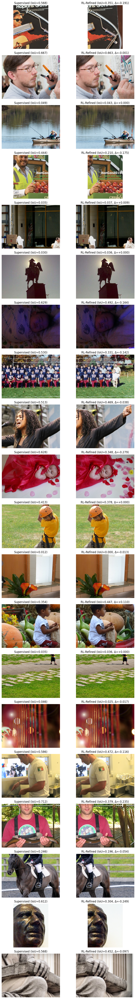

In [79]:
NUM_SAMPLES = 20

valid_indices = list(range(len(val_df)))
random.shuffle(valid_indices)

shown = 0
i = 0

plt.figure(figsize=(10, NUM_SAMPLES * 3))

while shown < NUM_SAMPLES and i < len(valid_indices):
    idx = valid_indices[i]
    i += 1

    sample = val_df.iloc[idx]
    img_path = sample["image_path"]

    # ---- load image safely ----
    image = cv2.imread(img_path)
    if image is None:
        continue

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Ground-truth box
    gt_box = np.array([
        sample["xc"],
        sample["yc"],
        sample["w"],
        sample["h"]
    ], dtype=np.float32)

    # Supervised prediction
    with torch.no_grad():
        img_tensor = transform(image).unsqueeze(0).to(device)
        pred_box = supervised_model(img_tensor).cpu().numpy()[0]

    init_box = clamp_box(pred_box)

    # Create RL environment
    env = CropEnv(
        image=image,
        gt_box=gt_box,
        init_box=init_box,
        max_steps=10
    )

    # Run ONE RL episode (inference only)
    with torch.no_grad():
        _, _, m = run_episode(env, policy, deterministic=True)


    # Get crops
    supervised_crop = CropEnv(image, gt_box, init_box).get_crop()
    rl_crop = env.get_crop()

    # Plot
    plt.subplot(NUM_SAMPLES, 2, shown * 2 + 1)
    plt.imshow(supervised_crop)
    plt.title(f"Supervised (IoU={compute_iou(init_box, gt_box):.3f})")
    plt.axis("off")

    plt.subplot(NUM_SAMPLES, 2, shown * 2 + 2)
    plt.imshow(rl_crop)
    plt.title(f"RL-Refined (IoU={m['final_iou']:.3f}, Δ={m['delta_iou']:+.3f})")
    plt.axis("off")

    shown += 1

plt.tight_layout()
plt.show()


In [80]:
TEST_DIR = Path("../images/test")
test_images = list(TEST_DIR.glob("*.jpg")) + list(TEST_DIR.glob("*.png"))

def dummy_gt_box():
    return np.array([0.5, 0.5, 0.6, 0.8], dtype=np.float32)

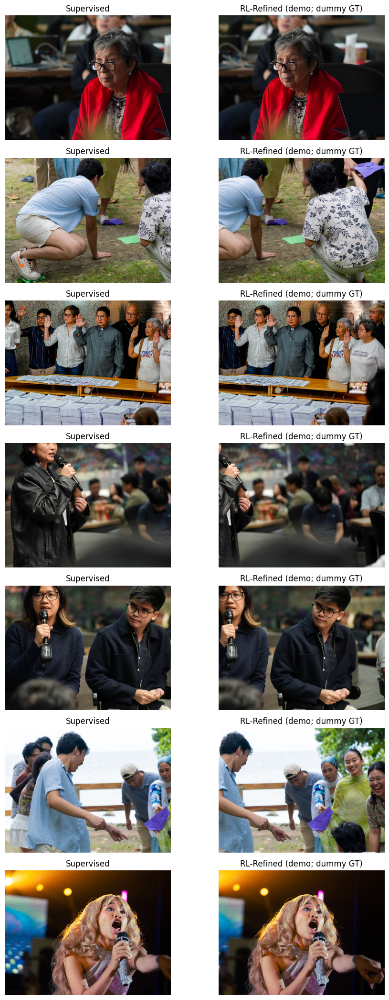

In [81]:
plt.figure(figsize=(10, len(test_images) * 3))

for i, img_path in enumerate(test_images):
    image = cv2.imread(str(img_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    with torch.no_grad():
        img_tensor = transform(image).unsqueeze(0).to(device)
        pred_box = supervised_model(img_tensor).cpu().numpy()[0]

    init_box = clamp_box(pred_box)
    gt = dummy_gt_box()

    env = CropEnv(image=image, gt_box=gt, init_box=init_box, max_steps=50)

    with torch.no_grad():
        _, _, m = run_episode(env, policy, deterministic=True)

    tmp_env = CropEnv(image=image, gt_box=gt, init_box=init_box, max_steps=1)
    supervised_crop = tmp_env.get_crop()
    rl_crop_test = env.get_crop()

    plt.subplot(len(test_images), 2, i*2 + 1)
    plt.imshow(supervised_crop)
    plt.title("Supervised")
    plt.axis("off")

    plt.subplot(len(test_images), 2, i*2 + 2)
    plt.imshow(rl_crop_test)
    plt.title("RL-Refined (demo; dummy GT)")
    plt.axis("off")

plt.tight_layout()
plt.show()

